This dataset was downloaded from [Kaggle](https://www.kaggle.com/datasets/fatihb/coffee-quality-data-cqi).

# About Dataset
## Coffee Quality Institute
The Coffee Quality Institute (CQI) is a non-profit organization that works to improve the quality and value of coffee worldwide. It was founded in 1996 and has its headquarters in California, USA.

CQI's mission is to promote coffee quality through a range of activities that include research, training, and certification programs. The organization works with coffee growers, processors, roasters, and other stakeholders to improve coffee quality standards, promote sustainability, and support the development of the specialty coffee industry.

## Data
CQI maintains a web database that serves as a resource for coffee professionals and enthusiasts who are interested in learning about coffee quality and sustainability. The database includes a range of information on coffee production, processing, and sensory evaluation. It also contains data on coffee genetics, soil types, and other factors that can affect coffee quality.

### Sensory evaluations (coffee quality scores)
- Aroma: Refers to the scent or fragrance of the coffee.
- Flavor: The flavor of coffee is evaluated based on the taste, including any sweetness, bitterness, acidity, and other flavor notes.
- Aftertaste: Refers to the lingering taste that remains in the mouth after swallowing the coffee.
- Acidity: Acidity in coffee refers to the brightness or liveliness of the taste.
- Body: The body of coffee refers to the thickness or viscosity of the coffee in the mouth.
- Balance: Balance refers to how well the different flavor components of the coffee work together.
- Uniformity: Uniformity refers to the consistency of the coffee from cup to cup.
- Clean Cup: A clean cup refers to a coffee that is free of any off-flavors or defects, such as sourness, mustiness, or staleness.
- Sweetness: It can be described as caramel-like, fruity, or floral, and is a desirable quality in coffee.

**PLEASE NOTE**: 'Total Cup Points' is literally the total of 10 features given above. There were some notebooks trying to predict the total cup points given these features. We know the exact function underlying the total cup points.

### Defects
Defects are undesirable qualities that can occur in coffee beans during processing or storage. Defects can be categorized into two categories: Category One and Category Two defects.

- **Category One defects** are primary defects that can be perceived through visual inspection of the coffee beans. These defects include Black beans, sour beans, insect-damaged beans, fungus-damaged beans, etc.

- **Category Two defects** are secondary defects that are more subtle and can only be detected through tasting. These defects include Over-fermentation, staleness, rancidness, chemical taste, etc.

---

Let's start the data profiling.

In [114]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

plt.style.use('ggplot')
pd.set_option('display.max_columns', 200)

In [127]:
coffee_df = pd.read_csv('./df_arabica_clean.csv', index_col=0)
coffee_df = coffee_df.drop('ID', axis=1) # ID is the same as index
coffee_df.head()

,Country of Origin,Farm Name,Lot Number,Mill,ICO Number,Company,Altitude,Region,Producer,Number of Bags,Bag Weight,In-Country Partner,Harvest Year,Grading Date,Owner,Variety,Status,Processing Method,Aroma,Flavor,Aftertaste,Acidity,Body,Balance,Uniformity,Clean Cup,Sweetness,Overall,Defects,Total Cup Points,Moisture Percentage,Category One Defects,Quakers,Color,Category Two Defects,Expiration,Certification Body,Certification Address,Certification Contact
0,Colombia,Finca El Paraiso,CQU2022015,Finca El Paraiso,NaN,Coffee Quality Union,1700-1930,"Piendamo,Cauca",Diego Samuel Bermudez,1,35 kg,Japan Coffee Exchange,2021 / 2022,"September 21st, 2022",Coffee Quality Union,Castillo,Completed,Double Anaerobic Washed,8.58,8.50,8.42,8.58,8.25,8.42,10.0,10.0,10.0,8.58,0.0,89.33,11.8,0,0,green,3,"September 21st, 2023",Japan Coffee Exchange,"〒413-0002 静岡県熱海市伊豆山１１７３−５８ 1173-58 Izusan, Ata...",松澤 宏樹 Koju Matsuzawa - +81(0)9085642901
1,Taiwan,Royal Bean Geisha Estate,"The 2022 Pacific Rim Coffee Summit,T037",Royal Bean Geisha Estate,NaN,Taiwan Coffee Laboratory,1200,Chiayi,曾福森,1,80 kg,Taiwan Coffee Laboratory 台灣咖啡研究室,2021 / 2022,"November 15th, 2022",Taiwan Coffee Laboratory 台灣咖啡研究室,Gesha,Completed,Washed / Wet,8.50,8.50,7.92,8.00,7.92,8.25,10.0,10.0,10.0,8.50,0.0,87.58,10.5,0,0,blue-green,0,"November 15th, 2023",Taiwan Coffee Laboratory 台灣咖啡研究室,"QAHWAH CO., LTD 4F, No. 225, Sec. 3, Beixin Rd...","Lin, Jen-An Neil 林仁安 - 886-289116612"
2,Laos,OKLAO coffee farms,"The 2022 Pacific Rim Coffee Summit,LA01",oklao coffee processing plant,NaN,Taiwan Coffee Laboratory,1300,Laos Borofen Plateau,WU TAO CHI,19,25 kg,Taiwan Coffee Laboratory 台灣咖啡研究室,2021 / 2022,"November 15th, 2022",Taiwan Coffee Laboratory 台灣咖啡研究室,Java,Completed,Semi Washed,8.33,8.42,8.08,8.17,7.92,8.17,10.0,10.0,10.0,8.33,0.0,87.42,10.4,0,0,yellowish,2,"November 15th, 2023",Taiwan Coffee Laboratory 台灣咖啡研究室,"QAHWAH CO., LTD 4F, No. 225, Sec. 3, Beixin Rd...","Lin, Jen-An Neil 林仁安 - 886-289116612"
3,Costa Rica,La Cumbre,CQU2022017,La Montana Tarrazu MIll,NaN,Coffee Quality Union,1900,"Los Santos,Tarrazu",Santa Maria de Dota,1,22 kg,Japan Coffee Exchange,2022,"September 21st, 2022",Coffee Quality Union,Gesha,Completed,Washed / Wet,8.08,8.17,8.17,8.25,8.17,8.08,10.0,10.0,10.0,8.25,0.0,87.17,11.8,0,0,green,0,"September 21st, 2023",Japan Coffee Exchange,"〒413-0002 静岡県熱海市伊豆山１１７３−５８ 1173-58 Izusan, Ata...",松澤 宏樹 Koju Matsuzawa - +81(0)9085642901
4,Colombia,Finca Santuario,CQU2023002,Finca Santuario,NaN,Coffee Quality Union,1850-2100,"Popayan,Cauca",Camilo Merizalde,2,24 kg,Japan Coffee Exchange,2022,"March 6th, 2023",Coffee Quality Union,Red Bourbon,Completed,"Honey,Mossto",8.33,8.33,8.08,8.25,7.92,7.92,10.0,10.0,10.0,8.25,0.0,87.08,11.6,0,2,yellow-green,2,"March 5th, 2024",Japan Coffee Exchange,"〒413-0002 静岡県熱海市伊豆山１１７３−５８ 1173-58 Izusan, Ata...",松澤 宏樹 Koju Matsuzawa - +81(0)9085642901


In [116]:
print('Number of records:', len(coffee_df.index))
print('Number of attributes:', len(coffee_df.columns))

Number of records: 207
Number of attributes: 39


In [117]:
coffee_df.columns

Index(['Country of Origin', 'Farm Name', 'Lot Number', 'Mill', 'ICO Number',
       'Company', 'Altitude', 'Region', 'Producer', 'Number of Bags',
       'Bag Weight', 'In-Country Partner', 'Harvest Year', 'Grading Date',
       'Owner', 'Variety', 'Status', 'Processing Method', 'Aroma', 'Flavor',
       'Aftertaste', 'Acidity', 'Body', 'Balance', 'Uniformity', 'Clean Cup',
       'Sweetness', 'Overall', 'Defects', 'Total Cup Points',
       'Moisture Percentage', 'Category One Defects', 'Quakers', 'Color',
       'Category Two Defects', 'Expiration', 'Certification Body',
       'Certification Address', 'Certification Contact'],
      dtype='object')

In [128]:
coffee_df = coffee_df.rename(columns={'Country of Origin': 'Country_of_Origin',
                                      'Farm Name': 'Farm_Name',
                                      'Lot Number': 'Lot_Number',
                                      'ICO Number': 'ICO_Number',
                                      'Number of Bags': 'Number_of_Bags',
                                      'Bag Weight': 'Bag_Weight_kg',
                                      'In-Country Partner': 'In_Country_Partner',
                                      'Harvest Year': 'Harvest_Year',
                                      'Grading Date': 'Grading_Date',
                                      'Processing Method': 'Processing_Method',
                                      'Clean Cup': 'Clean_Cup',
                                      'Total Cup Points': 'Total_Cup_Points',
                                      'Moisture Percentage': 'Moisture_Percentage',
                                      'Category One Defects': 'Category_One_Defects',
                                      'Category Two Defects': 'Category_Two_Defects',
                                      'Certification Body': 'Certification_Body',
                                      'Certification Address': 'Certification_Address',
                                      'Certification Contact': 'Certification_Contact'
                                      })

In [129]:
dtypes = coffee_df.dtypes
dtypes

Country_of_Origin         object
Farm_Name                 object
Lot_Number                object
Mill                      object
ICO_Number                object
Company                   object
Altitude                  object
Region                    object
Producer                  object
Number_of_Bags             int64
Bag_Weight_kg             object
In_Country_Partner        object
Harvest_Year              object
Grading_Date              object
Owner                     object
Variety                   object
Status                    object
Processing_Method         object
Aroma                    float64
Flavor                   float64
Aftertaste               float64
Acidity                  float64
Body                     float64
Balance                  float64
Uniformity               float64
Clean_Cup                float64
Sweetness                float64
Overall                  float64
Defects                  float64
Total_Cup_Points         float64
Moisture_P

Some of these attributes are supposed to be considered as numeric, but that's not being done, at the moment. Let's fix that.

Altitude sometimes contains the range in which the coffee was cultivated. We can either make two new columns (altitude_min, and altitude_max), or use the average of the two values. Creating the two columns, however, keeps most of the information intact.

In [120]:
a_uni = coffee_df.Altitude.unique().astype(str)
a_uni[np.char.str_len(a_uni) > 4]

array(['1700-1930', '1850-2100', '1400-1700', '1800-2200', '1900-2000',
       '1900-2100', '1570-1600', '1500-1700', '150-250', '2150 - 2350',
       '1600-1900', '300-500', '350-400', '200-300', '1300-1400',
       '1250-1350', '1500-1600', '1600-1750', '4895 A 5650', '400-600',
       '200-400', '250-400', '250-300', '1200 - 1580', '1400 - 1900',
       '1280-1325', '1300-1500', '1100-1200', '1200 - 1300', '1200-1350',
       '1500-1950', '800-1200', '1350-1550', '1200~1600', '900-1000',
       '600-800', '1300-1800', '850-1100'], dtype='<U11')

Here, we can see that the convention to show altitude ranges is not uniform. Sometimes it uses "-", sometimes "~", there's also an "A" in there for some reason, and also varying amounts of whitespace.

Bag weight, on the other hand, contains its unit of measurement. We first need to assess if that is always the case.

In [131]:
coffee_df.Bag_Weight_kg.value_counts()

30 kg       39
60 kg       31
69 kg       25
1 kg        14
15 kg       10
5 kg        10
2 kg         8
70 kg        6
100 kg       6
50 kg        6
10 kg        5
80 kg        4
35 kg        4
20 kg        3
12 kg        3
4 kg         2
25 kg        2
90 kg        2
45 kg        2
16 kg        2
13 kg        2
22 kg        2
19200 kg     2
8 kg         2
40 kg        1
32 kg        1
200 kg       1
3 kg         1
320 kg       1
6 kg         1
104 kg       1
110 kg       1
300 kg       1
36 kg        1
24 kg        1
48 kg        1
85 kg        1
27 kg        1
59 kg        1
Name: Bag_Weight_kg, dtype: int64

In [132]:
coffee_df.Bag_Weight_kg = pd.to_numeric(coffee_df['Bag_Weight_kg'].apply(lambda x: x.split(' ')[0]))
coffee_df.Bag_Weight_kg

0      35
1      80
2      25
3      22
4      24
       ..
202    60
203    30
204    60
205     2
206    60
Name: Bag_Weight_kg, Length: 207, dtype: int64

Harvest year, Grading Date and Expiration are all dates. Harvest Year is only the year of the harvest, so that will become numeric.

In [133]:
print(coffee_df.Harvest_Year.value_counts(), '\n')
print(coffee_df.Grading_Date.value_counts(), '\n')
print(coffee_df.Expiration.value_counts(), '\n')

2021 / 2022    99
2022           48
2022 / 2023    42
2021           13
2023            3
2017 / 2018     1
2018 / 2019     1
Name: Harvest_Year, dtype: int64 

November 15th, 2022     40
January 6th, 2023       26
December 12th, 2022      8
July 14th, 2022          7
December 30th, 2022      7
                        ..
February 22nd, 2023      1
April 5th, 2023          1
September 26th, 2022     1
January 18th, 2023       1
November 11th, 2022      1
Name: Grading_Date, Length: 75, dtype: int64 

November 15th, 2023     40
January 6th, 2024       26
December 12th, 2023      8
July 14th, 2023          7
December 30th, 2023      7
                        ..
February 22nd, 2024      1
April 4th, 2024          1
September 26th, 2023     1
January 18th, 2024       1
November 11th, 2023      1
Name: Expiration, Length: 75, dtype: int64 



Harvest Year seems to have an ambiguous format, sometimes, with two years separated by a forward slash. The others seem fine. We're going to assume the earliest harvest year is the most important one to consider.

In [134]:
coffee_df.Harvest_Year = coffee_df.Harvest_Year.apply(lambda x: x.split(' ')[0])

coffee_df.Harvest_Year = pd.to_numeric(coffee_df.Harvest_Year)
coffee_df.Grading_Date = pd.to_datetime(coffee_df.Grading_Date)
coffee_df.Expiration = pd.to_datetime(coffee_df.Expiration)

Total Number of Atributes: 37
Categorical 18 -> ['Country_of_Origin', 'Farm_Name', 'Lot_Number', 'Mill', 'ICO_Number', 'Company', 'Altitude', 'Region', 'Producer', 'In_Country_Partner', 'Owner', 'Variety', 'Status', 'Processing_Method', 'Color', 'Certification_Body', 'Certification_Address', 'Certification_Contact']
Discrete Numeric: 6 -> ['Number_of_Bags', 'Bag_Weight_kg', 'Harvest_Year', 'Category_One_Defects', 'Quakers', 'Category_Two_Defects']
Continuous Numeric: 13 -> ['Aroma', 'Flavor', 'Aftertaste', 'Acidity', 'Body', 'Balance', 'Uniformity', 'Clean_Cup', 'Sweetness', 'Overall', 'Defects', 'Total_Cup_Points', 'Moisture_Percentage']
Total Numeric: 19


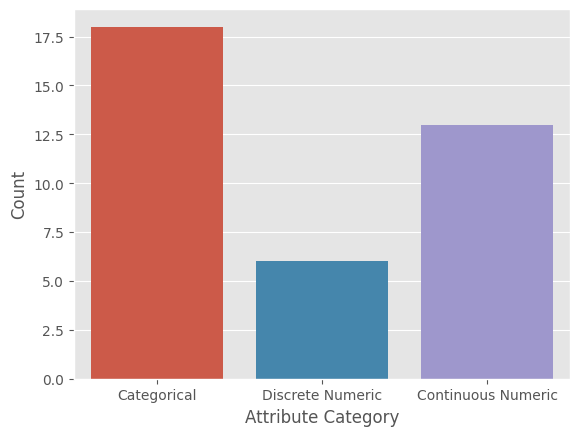

In [135]:
dtypes = coffee_df.dtypes

categorical_atts = dtypes[dtypes == 'object'].index.tolist()
discrete_atts = dtypes[dtypes == 'int64'].index.tolist()
continuous_atts = dtypes[dtypes == 'float64'].index.tolist()
numeric_atts = discrete_atts.copy()
numeric_atts.extend(continuous_atts)

categories = ['Categorical', 'Discrete Numeric', 'Continuous Numeric']
counts = [len(categorical_atts), len(discrete_atts), len(continuous_atts)]

ax = sns.barplot(x=categories, y=counts)
_ = ax.set_xlabel('Attribute Category')
_ = ax.set_ylabel('Count')

print('Total Number of Atributes:', sum(counts))
print('Categorical', counts[0], '->', categorical_atts)
print('Discrete Numeric:', counts[1], '->', discrete_atts)
print('Continuous Numeric:', counts[2], '->', continuous_atts)
print('Total Numeric:', counts[1] + counts[2])

39 attributes is already a lot, especially taking into account that we only have 207 records. This means that, if we are to use machine learning models, we are likely to encounter the Hughes phenomenon, also known as the [Curse of Dimensionality](https://en.wikipedia.org/wiki/Curse_of_dimensionality) -- the more attributes we consider in our models, the more records we would need to improve precision. Since we have a fixed number of records, the performance is likely to improve when we start considering more attributes, but it's eventually going to peak and start decreasing.

To deal with this, we are likely going to have to choose the attributes we find best suited for our purposes, during the preprocessing phase.

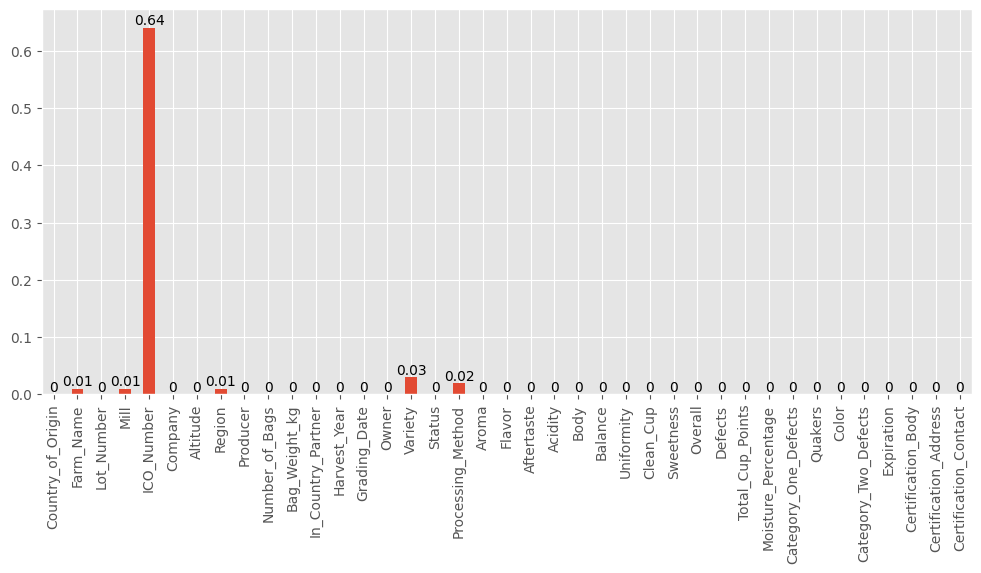

In [136]:
ax = (round(coffee_df.isna().sum() / len(coffee_df), 2)).plot(kind='bar', figsize=(12, 5))
_ = ax.bar_label(ax.containers[0])

As we can see, the 'ICO number' attribute has a large amount of missing values. ~64% of missing values makes the attribute somewhat useless. However, the 'ICO number' is just a number the International Coffee Organization (ICO) attributes to each parcel of coffee; it is, therefore, not of much value.

Some other variables also have missing values, but these are at most 3% of the records. We shall decide what we do with them later.

In [137]:
coffee_df = coffee_df.drop('ICO_Number', axis=1)

# Numeric Attributes

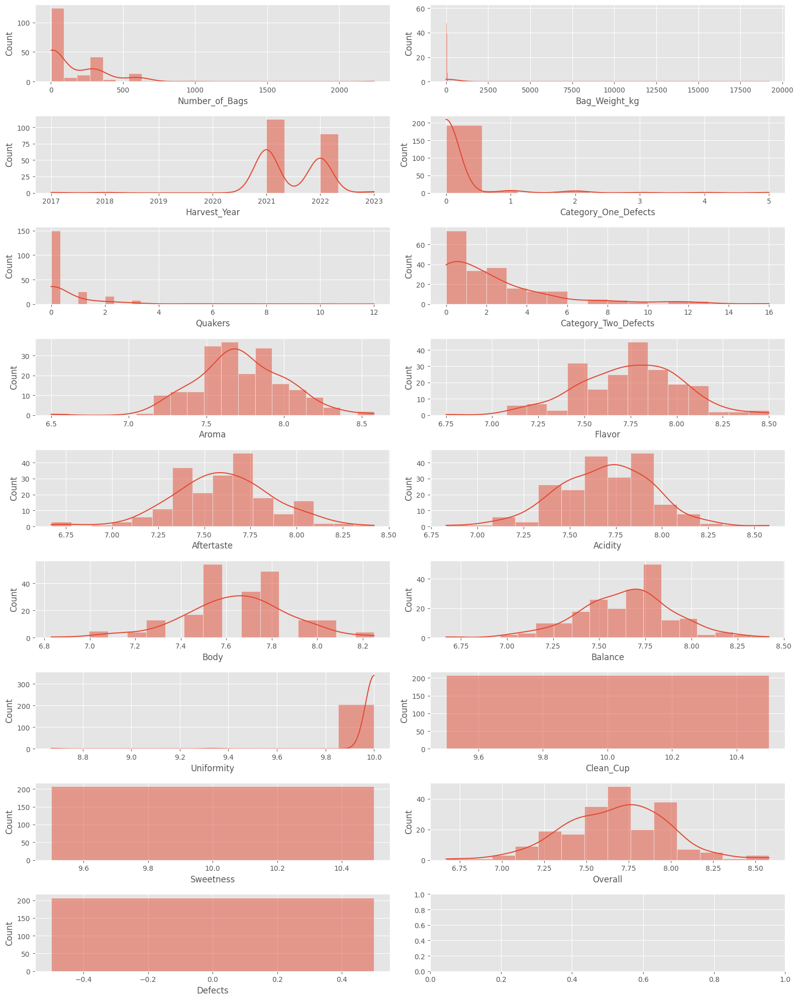

In [138]:
fig, ax = plt.subplots(nrows=9, ncols=2, figsize=(16, 20))
ax = ax.flatten()

for i in range(len(ax) - 1):
    sns.histplot(data=coffee_df[numeric_atts[i]], ax=ax[i], kde=True)

plt.tight_layout()

From the above plots, we can see that there are some well-known distributions. The discrete attributes (i.e., 'Number of Bags', 'Category One Defects', 'Quakers', 'Category Two Defects') all seem to follow something similar to Poisson distributions.

The continuous attributes, on the other hand, mostly seem to approximately follow a normal distribution, which is very handy. Out of these, Clean Cup, Sweetness, and Defects seems uniform (we'll have to investigate this), Aroma seems too peaked to be normal, and Uniformity seems nearly uniform.

In [139]:
columns = ['Clean_Cup', 'Sweetness', 'Defects', 'Uniformity']

for col in columns:
    print(f"Unique values for column '{col}':")
    for value in coffee_df[col].unique():
        print(value)
    print()

Unique values for column 'Clean_Cup':
10.0

Unique values for column 'Sweetness':
10.0

Unique values for column 'Defects':
0.0

Unique values for column 'Uniformity':
10.0
9.33
8.67



As we can see, 'Clean Cup', 'Sweetness' and 'Defects' have only one unique value. They are, therefore, not of much use for later predictions.

Uniformity seems to have unique values that are very close to one another, and the bins automatically selected by seaborn might be too large to capture this. Let's "zoom in". 

10.00    205
9.33       1
8.67       1
Name: Uniformity, dtype: int64


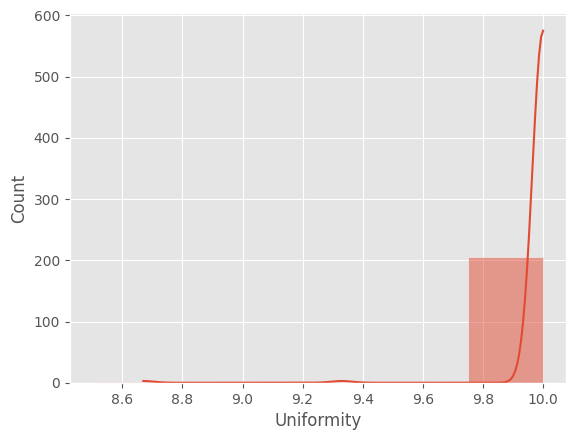

In [140]:
import numpy as np
_ = sns.histplot(data=coffee_df, x='Uniformity', kde=True, bins=np.arange(8.5, 10.25, 0.25))
print(coffee_df.Uniformity.value_counts())

As we can see here, nearly all of Uniformity's values are equal to 10, and the others seem to be outliers or noise. There are, therefore, a few variables we can drop: Uniformity, Sweetness, Clean Cup, and Defects.

In [141]:
coffee_df = coffee_df.drop(['Uniformity', 'Sweetness', 'Clean_Cup', 'Defects'], axis=1)

dtypes = coffee_df.dtypes
categorical_atts = dtypes[dtypes == 'object'].index.tolist()
discrete_atts = dtypes[dtypes == 'int64'].index.tolist()
continuous_atts = dtypes[dtypes == 'float64'].index.tolist()
numeric_atts = discrete_atts.copy()
numeric_atts.extend(continuous_atts)

Let's move on to the 5-Number-Summary and the boxplots.

In [142]:
coffee_df.describe()

,Number_of_Bags,Bag_Weight_kg,Harvest_Year,Aroma,Flavor,Aftertaste,Acidity,Body,Balance,Overall,Total_Cup_Points,Moisture_Percentage,Category_One_Defects,Quakers,Category_Two_Defects
count,207.000000,207.000000,207.000000,207.000000,207.000000,207.000000,207.00000,207.000000,207.000000,207.000000,207.000000,207.000000,207.000000,207.000000,207.000000
mean,155.449275,227.782609,2021.429952,7.721063,7.744734,7.599758,7.69029,7.640918,7.644058,7.676812,83.706570,10.735266,0.135266,0.690821,2.251208
std,244.484868,1878.909774,0.656315,0.287626,0.279613,0.275911,0.25951,0.233499,0.256299,0.306359,1.730417,1.247468,0.592070,1.686918,2.950183
min,1.000000,1.000000,2017.000000,6.500000,6.750000,6.670000,6.83000,6.830000,6.670000,6.670000,78.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,15.000000,2021.000000,7.580000,7.580000,7.420000,7.50000,7.500000,7.500000,7.500000,82.580000,10.100000,0.000000,0.000000,0.000000
50%,14.000000,30.000000,2021.000000,7.670000,7.750000,7.580000,7.67000,7.670000,7.670000,7.670000,83.750000,10.800000,0.000000,0.000000,1.000000
75%,275.000000,60.000000,2022.000000,7.920000,7.920000,7.750000,7.87500,7.750000,7.790000,7.920000,84.830000,11.500000,0.000000,1.000000,3.000000
max,2240.000000,19200.000000,2023.000000,8.580000,8.500000,8.420000,8.58000,8.250000,8.420000,8.580000,89.330000,13.500000,5.000000,12.000000,16.000000


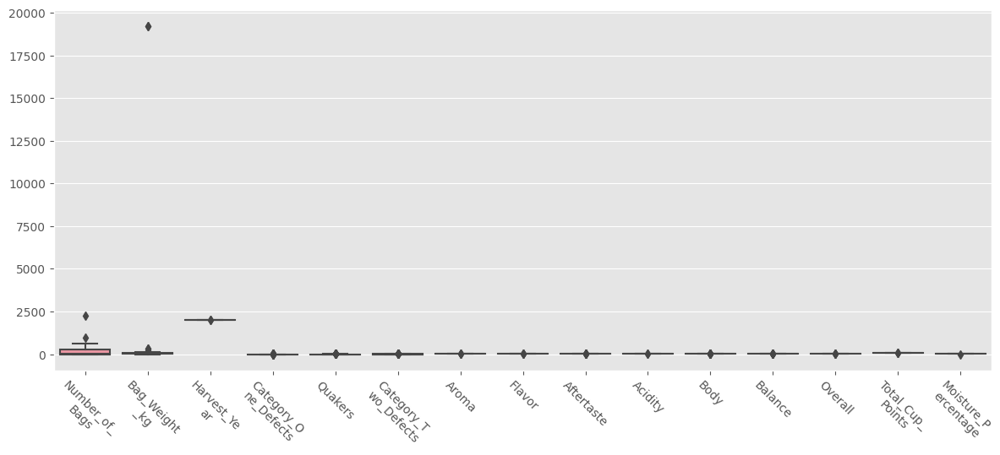

In [143]:
import textwrap

def wrap_labels(ax, width, break_long_words=False):
    labels = []
    for label in ax.get_xticklabels():
        text = label.get_text()
        labels.append(textwrap.fill(text, width=width,
                      break_long_words=break_long_words))
    ax.set_xticklabels(labels, rotation=0)

plt.figure(figsize=(12, 5))
ax = sns.boxplot(data=coffee_df[numeric_atts])
wrap_labels(ax, 10, True)
plt.tight_layout()
ax.tick_params('x', labelrotation=-45)

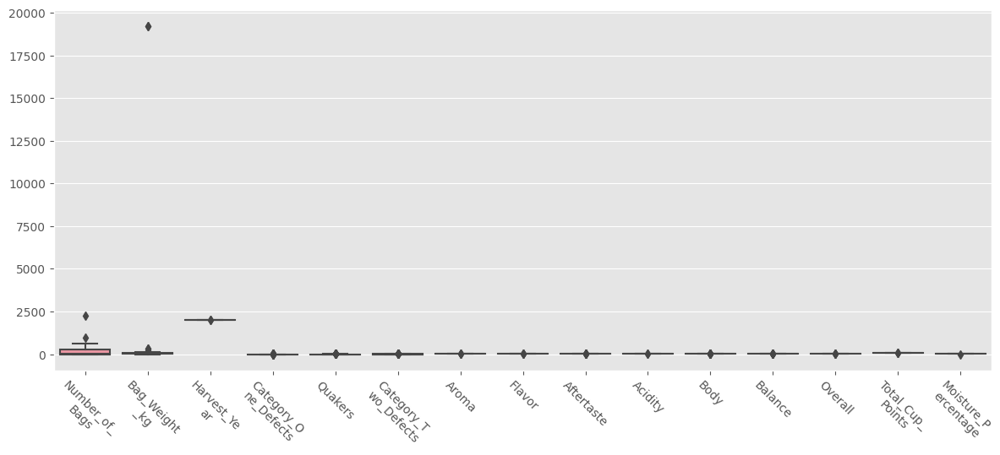

In [144]:
import numpy as np

plt.figure(figsize=(12, 5))
numeric_atts = np.array(numeric_atts)
ax = sns.boxplot(data=coffee_df[numeric_atts[numeric_atts != 'Number of Bags']])
wrap_labels(ax, 10, True)
plt.tight_layout()
ax.tick_params('x', labelrotation=-45)

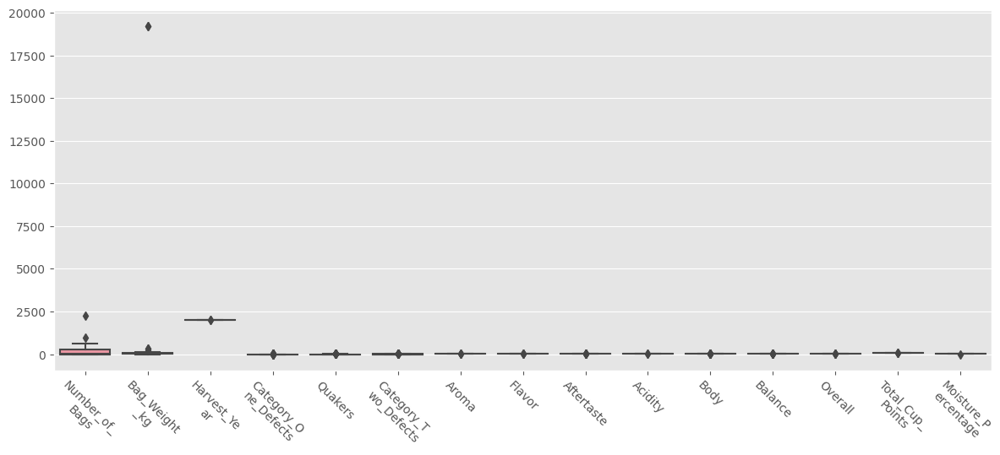

In [145]:
import numpy as np

plt.figure(figsize=(12, 5))
numeric_atts = np.array(numeric_atts)
ax = sns.boxplot(data=coffee_df[numeric_atts[(numeric_atts != 'Number of Bags') & (numeric_atts != 'Total Cup Points')]])
wrap_labels(ax, 10, True)
plt.tight_layout()
ax.tick_params('x', labelrotation=-45)

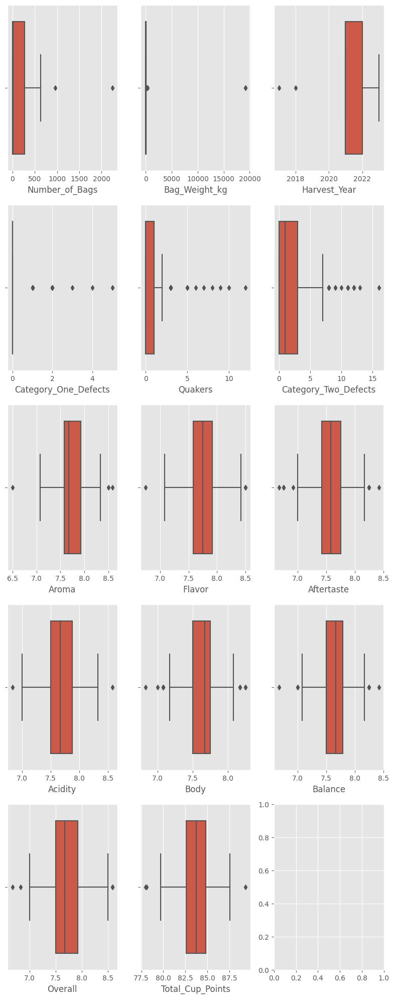

In [146]:
fig, ax = plt.subplots(nrows=5, ncols=3, figsize=(8, 20))
ax = ax.flatten()

for i in range(len(ax) - 1):
    sns.boxplot(data=coffee_df, x=numeric_atts[i], ax=ax[i])

plt.tight_layout()

We can see from the two first boxplots that Number of Bags and Total Cup Points have considerably different scales from the other attributes. Scaling procedures would, therefore, be necessary to help our machine learning algorithms to stabilise the learning phase and to perform better in general (as mentioned [here](https://machinelearningmastery.com/how-to-improve-neural-network-stability-and-modeling-performance-with-data-scaling/), for example). If we use non-parametric machine learning algorithms, such as KNN and K-Means clustering, this is also very relevant.

It is also important to mention that there are quite a few variables with potential outliers, and that most distributions are not skewed (which we could already see earlier from the histograms). Whenever they are skewed, however, as well as when we're in the presence of too many outliers, it is better to use the median as a measure of the central tendency of the distribution, and not the mean.

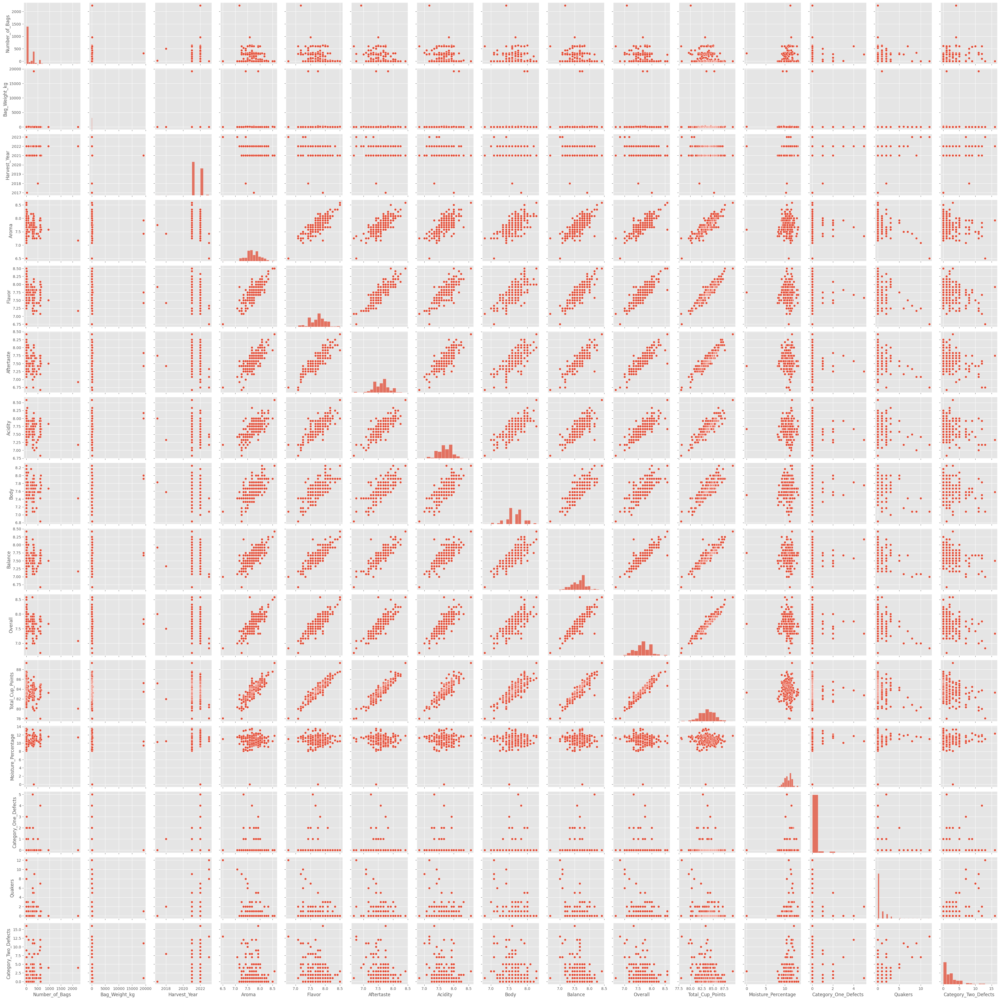

In [147]:
_ = sns.pairplot(data=coffee_df)

These scatter plots tell us quite a few things. 

First of all, there are some clear correlations between a few variables, namely: each sensory evaluation attribute seems to be correlated with the others of its kind (which might mean that, for example, higher acidity might imply more aroma, or a thicker body; at least, according to our dataset). Furthe, the Overall and Total Cup Points attributes are highly correlated with each other and with the sensory evaluation attributes. The Total Cup Points correlation is expected since, according to the user that provided the dataset on Kaggle, this attribute is merely the sum of the sensory evaluation attributes. Regarding the Overall attribute, we don't have any information about it, but it looks very similar to Total Cup Points.

The second thing we can see is that some attributes are sparser than others, which we can see from the "density" of the datapoints in each plot and the domain ranges that they occupy. It's good that an attribute does not occupy "all" the possible values of the feature space; otherwise, it would be meaningless to have it, since no information could be extracted from it. However, it's always good to see if there are parts of the domain 

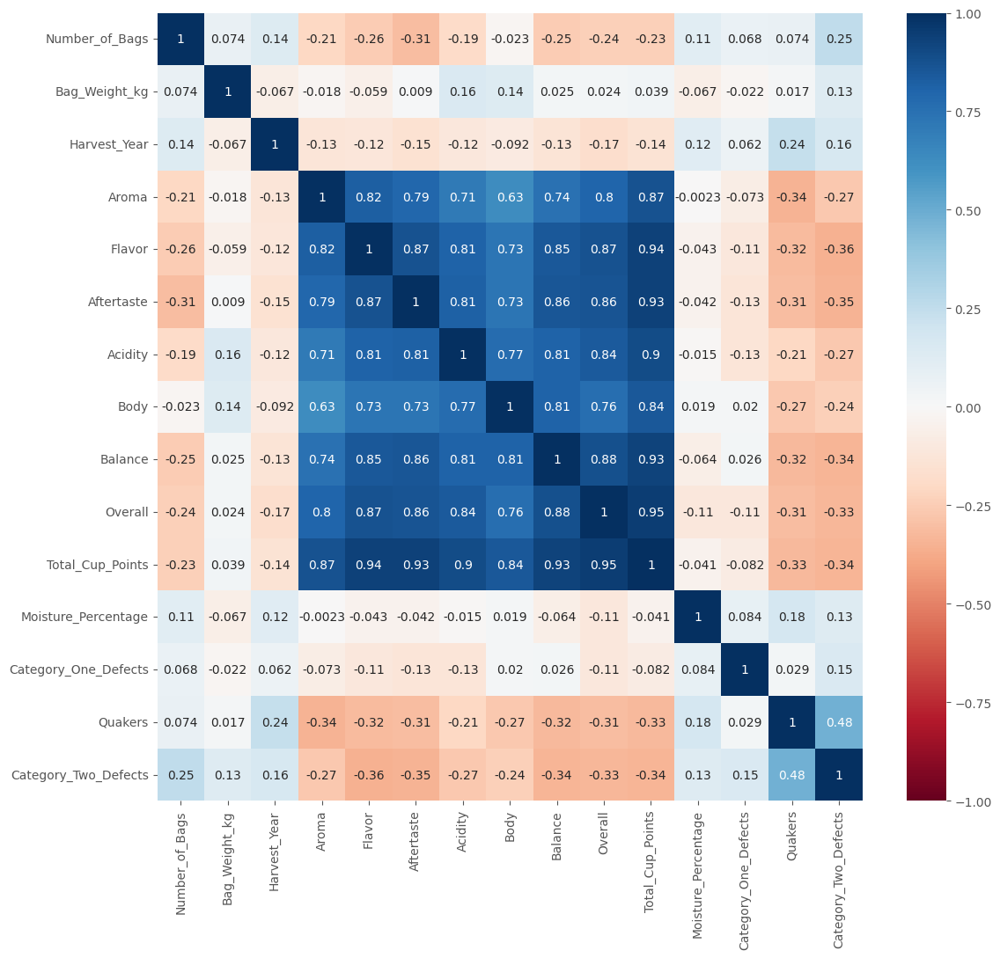

In [148]:
fig = plt.figure(figsize=(12, 11))

sns.heatmap(data=coffee_df.dropna().corr(numeric_only=True), vmin=-1, vmax=1, cmap='RdBu', annot=True)
plt.tight_layout()

# Categorical Attributes

# Automatic Profiling

In [149]:
from ydata_profiling import ProfileReport

ProfileReport(coffee_df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]